This notebook contains the code used to generate figures related to the transcriptomic type-based spatial patterns, but relies on data and libraries that are on internal systems, so it is provided for reference (rather than being able to be run on its own). The notebook shows the results for the CP spatial patterns; the other basal ganglia structure figures were produced in similar fashion.

In [1]:
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import spams
import os
import nrrd
from skimage.measure import find_contours


In [2]:
hist_609882_f = h5py.File("brain_609882_cp_fineres_a21freeze.h5", "r")
hist_609889_f = h5py.File("brain_609889_cp_fineres_a21freeze.h5", "r")

In [3]:
ttypes = hist_609882_f['ttypes'][:]

In [4]:
dict_609889_f = h5py.File("../nmf_dicts/brain_609889_cp_fineres_ait21freeze_dictionaries.h5", "r")

In [5]:
dict_609882_f = h5py.File("../nmf_dicts/brain_609882_cp_fineres_ait21freeze_dictionaries.h5", "r")

In [6]:
dict_638850_f = h5py.File("../nmf_dicts/brain_638850_cp_fineres_ait21freeze_dictionaries.h5", "r")

In [7]:
components_609889 = dict_609889_f['stability']['components'][...]
stability_609889 = dict_609889_f['stability']['stability_values'][...]
stab_std_609889 = dict_609889_f['stability']['stability_std'][...]

In [8]:
components_609882 = dict_609882_f['stability']['components'][...]
stability_609882 = dict_609882_f['stability']['stability_values'][...]
stab_std_609882 = dict_609882_f['stability']['stability_std'][...]

In [9]:
components_638850 = dict_638850_f['stability']['components'][...]
stability_638850 = dict_638850_f['stability']['stability_values'][...]
stab_std_638850 = dict_638850_f['stability']['stability_std'][...]

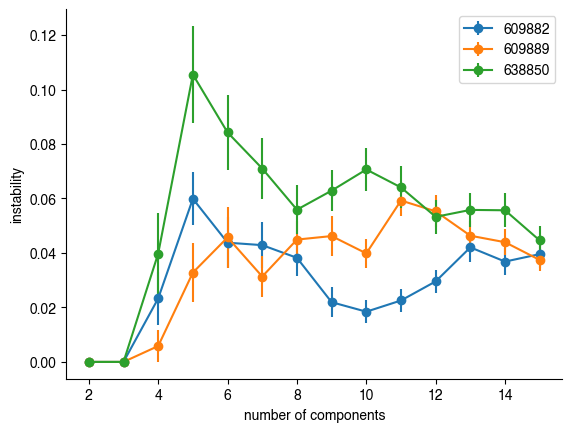

In [10]:
plt.errorbar(components_609882, stability_609882, marker='o', yerr=stab_std_609882, label="609882")
plt.errorbar(components_609889, stability_609889, marker='o', yerr=stab_std_609889, label="609889")
plt.errorbar(components_638850, stability_638850, marker='o', yerr=stab_std_638850, label="638850")

plt.xlabel("number of components")
plt.ylabel("instability")
plt.legend()
sns.despine()

In [11]:
hists_as_1d_arr_609882 = hist_609882_f['data'][:]
hists_as_1d_arr_609889 = hist_609889_f['data'][:]

In [12]:
tight_borders_609882 = hist_609882_f['tight_borders'][:]
bin_step_609882 = hist_609882_f['tight_borders'].attrs['bin_step']

In [13]:
tight_borders_609889 = hist_609889_f['tight_borders'][:]
bin_step_609889 = hist_609889_f['tight_borders'].attrs['bin_step']

In [14]:
bin_coords_609882 = np.zeros((hists_as_1d_arr_609882.shape[0], 2))
total_size = 0
for tb in tight_borders_609882:
    x_edges = np.arange(tb[0], tb[1] + bin_step_609882, bin_step_609882)
    y_edges = np.arange(tb[2], tb[3] + bin_step_609882, bin_step_609882)
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    xv, yv = np.meshgrid(x_centers, y_centers, indexing='ij')
    bin_coords_609882[total_size:total_size + xv.size, 0] = xv.flatten()
    bin_coords_609882[total_size:total_size + yv.size, 1] = yv.flatten()
    total_size += xv.size

In [15]:
bin_coords_609889 = np.zeros((hists_as_1d_arr_609889.shape[0], 2))
total_size = 0
for tb in tight_borders_609889:
    x_edges = np.arange(tb[0], tb[1] + bin_step_609889, bin_step_609889)
    y_edges = np.arange(tb[2], tb[3] + bin_step_609889, bin_step_609889)
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    xv, yv = np.meshgrid(x_centers, y_centers, indexing='ij')
    bin_coords_609889[total_size:total_size + xv.size, 0] = xv.flatten()
    bin_coords_609889[total_size:total_size + yv.size, 1] = yv.flatten()
    total_size += xv.size

In [16]:
def score_dictionaries(data, dictionaries, lambda_val=0, gamma1_val=0):
    param = {
        "mode": 2,
        "lambda1": lambda_val,
        "pos": True,
    }    
    
    obj_values = np.zeros(dictionaries.shape[-1])
    for i in range(dictionaries.shape[-1]):
        D = dictionaries[:, :, i]
        D_norm = D / D.max(axis=0) 
        
        alpha = spams.lasso(data, np.asfortranarray(D_norm), **param)
        
        obj = np.square(data - D @ alpha).sum(axis=0).mean()
        obj_values[i] = obj
        
    return obj_values

In [17]:
X_input_609882 = np.asfortranarray(hists_as_1d_arr_609882)
X_input_609889 = np.asfortranarray(hists_as_1d_arr_609889)

In [18]:
k_str = '10' # minimum for brain 609882

In [19]:
nmf_609889_dict = dict_609889_f['dictionaries'][k_str][...]
nmf_609882_dict = dict_609882_f['dictionaries'][k_str][...]

In [20]:
scores_best_609882_k = score_dictionaries(X_input_609882, nmf_609882_dict)

In [21]:
scores_best_609889_k = score_dictionaries(X_input_609889, nmf_609889_dict)

In [22]:
best_dict_609882 = np.argmin(scores_best_609882_k)
best_dict_609889 = np.argmin(scores_best_609889_k)

In [23]:
# Calculate the weights (alpha) for each t-type

param = {
    "mode": 2,
    "lambda1": 0,
    "pos": True,
}    

D = nmf_609882_dict[:, :, best_dict_609882]
D_norm = D / D.max(axis=0) 

alpha_609882 = spams.lasso(X_input_609882, np.asfortranarray(D_norm), **param)


D = nmf_609889_dict[:, :, best_dict_609889]
D_norm = D / D.max(axis=0) 

alpha_609889 = spams.lasso(X_input_609889, np.asfortranarray(D_norm), **param)


In [24]:
pattern_order = [4, 5, 1, 2, 9, 7, 8, 0, 3, 6] # custom ordering of patterns
pattern_lookup = {v: k for k, v in enumerate(pattern_order)}

In [25]:
sorter = sorted(np.arange(len(ttypes)),
                key=lambda x: (pattern_lookup[alpha_609882.toarray().argmax(axis=0)[x]],
                               -alpha_609882.toarray().max(axis=0)[x]))

<Axes: >

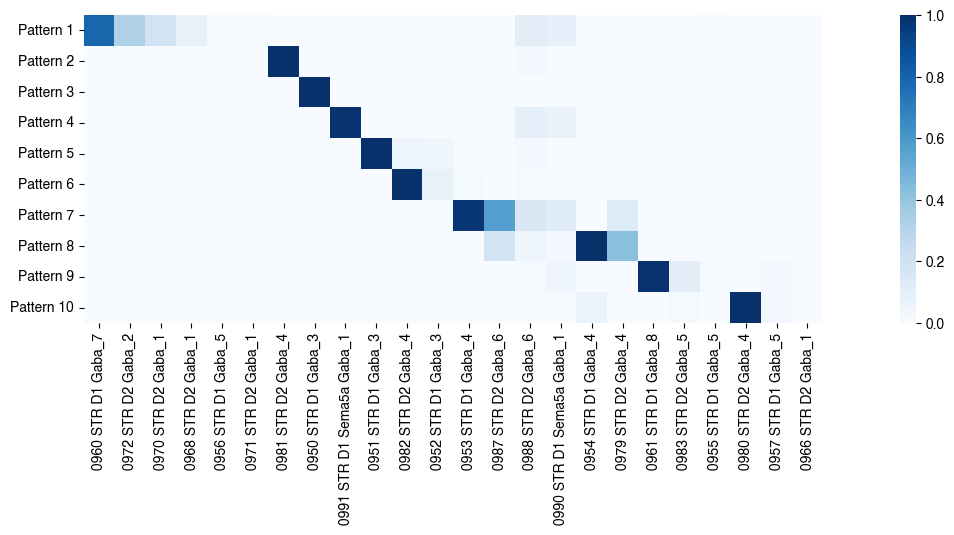

In [26]:
# Plot a sorted heatmap of the weights
sorter = sorted(np.arange(len(ttypes)),
                key=lambda x: (alpha_609882.toarray().argmax(axis=0)[x],
                               -alpha_609882.toarray().max(axis=0)[x]))
plt.figure(figsize=(20, 4))

plot_data = alpha_609882.toarray()[:, sorter]

sns.heatmap(
    data=plot_data,
    xticklabels=[s.decode() for s in ttypes[sorter]],
    yticklabels=[f"Pattern {i + 1}" for i in range(alpha_609882.shape[0])],
    cmap='Blues',
    vmin=0, vmax=1,
    square=True
)

In [29]:
Ai = np.linalg.pinv(alpha_609882.toarray())

In [30]:
D = nmf_609882_dict[:, :, best_dict_609882]
D_norm = D / D.max(axis=0) 

In [31]:
hist_638850_f = h5py.File("brain_638850_cp_fineres_a21freeze.h5", "r")

In [32]:
ttypes_638850 = hist_638850_f['ttypes'][:]

In [33]:
hists_as_1d_arr_638850 = hist_638850_f['data'][:]

In [34]:
D_approx_638850 = hists_as_1d_arr_638850 @ Ai

In [35]:
tight_borders_638850 = hist_638850_f['tight_borders'][:]
bin_step_638850 = hist_638850_f['tight_borders'].attrs['bin_step']

In [36]:
bin_coords_638850 = np.zeros((hists_as_1d_arr_638850.shape[0], 2))
total_size = 0
for tb in tight_borders_638850:
    x_edges = np.arange(tb[0], tb[1] + bin_step_638850, bin_step_638850)
    y_edges = np.arange(tb[2], tb[3] + bin_step_638850, bin_step_638850)
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    xv, yv = np.meshgrid(x_centers, y_centers, indexing='ij')
    bin_coords_638850[total_size:total_size + xv.size, 0] = xv.flatten()
    bin_coords_638850[total_size:total_size + yv.size, 1] = yv.flatten()
    total_size += xv.size

In [37]:
# np.save("cp_d_approx_638850", D_approx_638850)

In [38]:
alpha_approx = spams.lasso(np.asfortranarray(hists_as_1d_arr_638850), np.asfortranarray(D_approx_638850), **param)


In [39]:
sorter = sorted(np.arange(len(ttypes)),
                key=lambda x: (alpha_approx.toarray().argmax(axis=0)[x],
                               -alpha_approx.toarray().max(axis=0)[x]))

In [40]:
mfish_data_dir = "/path/to/merfish_imputed_obs.cpq"

In [41]:
spatial_xy_df = pd.read_parquet(os.path.join(mfish_data_dir, "obsm/spatial_cirro.parquet"))
spatial_xy = spatial_xy_df.values

In [42]:
ccf_xyz_df = pd.read_parquet(os.path.join(mfish_data_dir, "obsm/ccf3D.parquet"))
ccf_xyz = ccf_xyz_df.values

In [ ]:
# find average ccf location for each bin

bin_ccf_coords_638850 = np.zeros((hists_as_1d_arr_638850.shape[0], 3))
total_size = 0
bin_index = 0
for tb in tight_borders_638850:
    print(tb, bin_index)
    x_edges = np.arange(tb[0], tb[1] + bin_step_638850, bin_step_638850)
    y_edges = np.arange(tb[2], tb[3] + bin_step_638850, bin_step_638850)
    xedge_above_masks = spatial_xy[:, 0][:, np.newaxis] >= x_edges[np.newaxis, :]
    xedge_below_masks = spatial_xy[:, 0][:, np.newaxis] < x_edges[np.newaxis, :]
    yedge_above_masks = spatial_xy[:, 1][:, np.newaxis] >= y_edges[np.newaxis, :]
    yedge_below_masks = spatial_xy[:, 1][:, np.newaxis] < y_edges[np.newaxis, :]
    for xi in range(len(x_edges) - 1):
        x_mask = xedge_above_masks[:, xi] & xedge_below_masks[:, xi + 1]
        for yi in range(len(y_edges) - 1):
            if bin_index % 1000 == 0:
                print(bin_index)    
            y_mask = yedge_above_masks[:, yi] & yedge_below_masks[:, yi + 1]
            mask = x_mask & y_mask
            bin_ccf_coords_638850[bin_index, :] = ccf_xyz[mask, :].mean(axis=0)
            bin_index += 1


In [ ]:
np.save("bin_cp_fineres_ccf_638850.pkl", bin_ccf_coords_638850)

In [43]:
bin_ccf_coords_638850 = np.load("bin_cp_fineres_ccf_638850.pkl.npy") # if previously calculated, load those values

4 2120
5 4549
1 3516
2 4192
9 1468
7 1688
8 859
0 520
3 1724
6 912


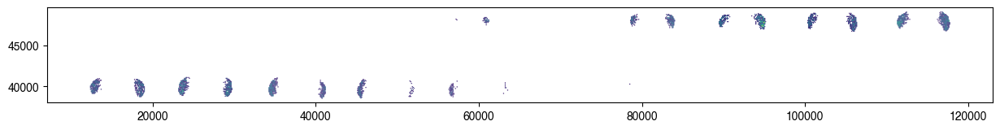

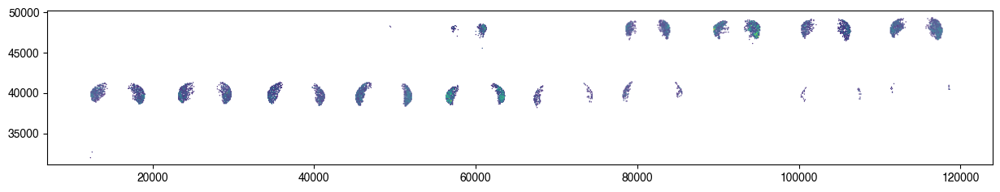

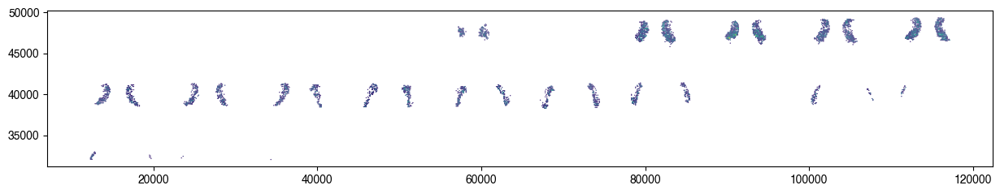

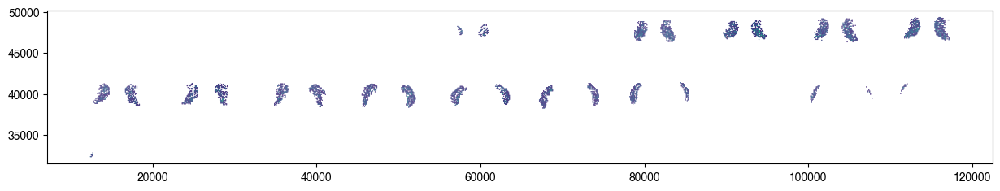

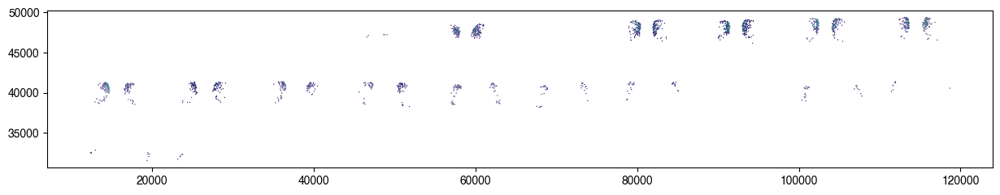

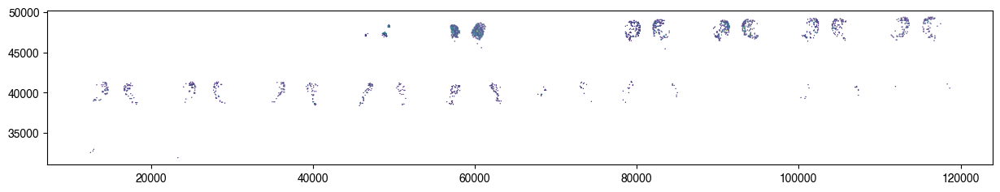

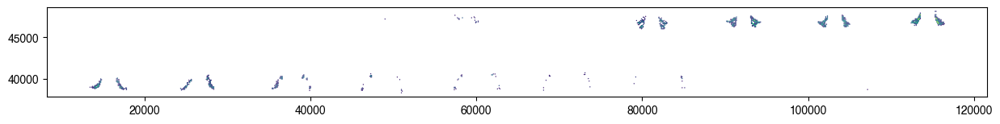

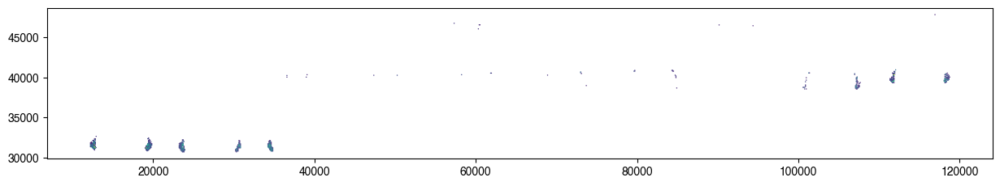

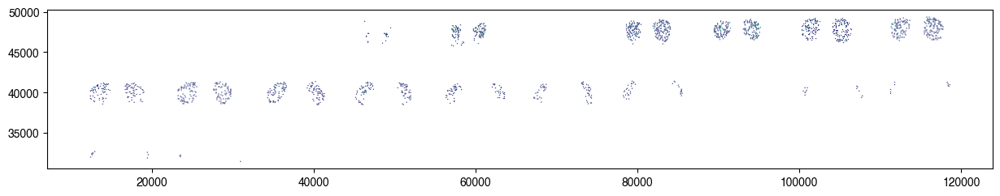

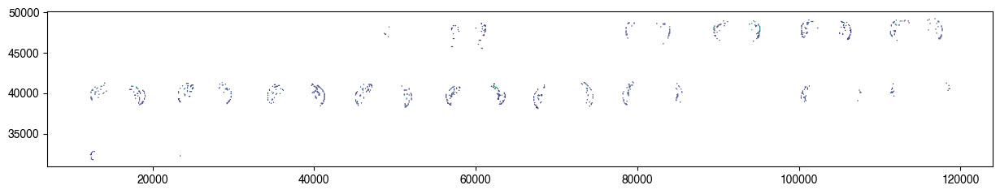

In [44]:
for i in pattern_order:
    plt.figure(figsize=(15, 15))
    mask = D_approx_638850[:, i] > 0.1
    print(i, mask.sum())
    plt.scatter(bin_coords_638850[mask, 0], bin_coords_638850[mask, 1],
                c=D_approx_638850[mask, i], s=1, edgecolors='none', vmin=0, vmax=1)
    plt.gca().set_aspect("equal")

In [45]:
import plotly.graph_objects as go

In [46]:
pal = sns.color_palette('muted', n_colors=10)

In [47]:
# make combo slice figure
D = nmf_609882_dict[:, :, best_dict_609882]
D_norm = D / D.max(axis=0) 

4 8048
5 12111
1 4333
2 8869
9 4804
7 3519
8 1268
0 1722
3 4156
6 3021


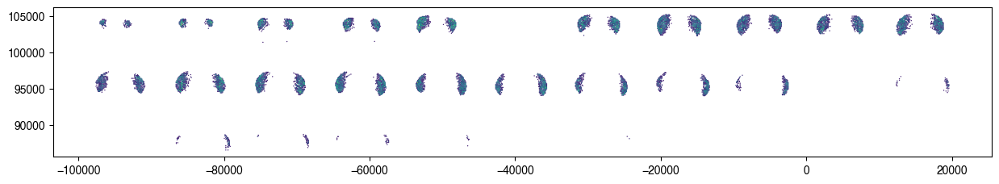

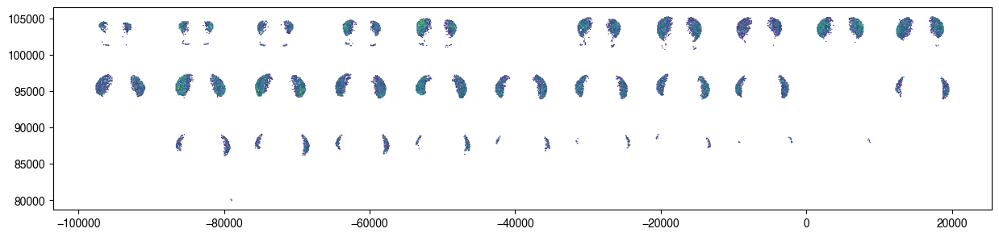

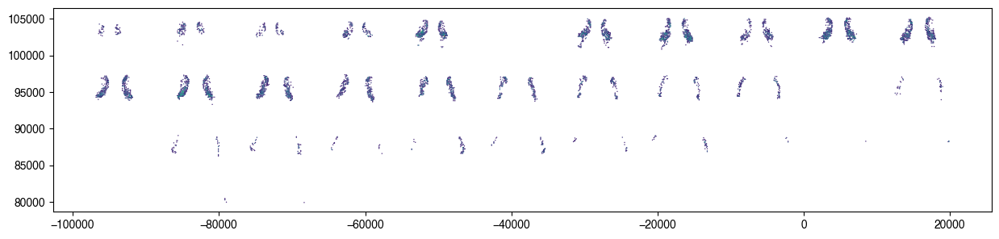

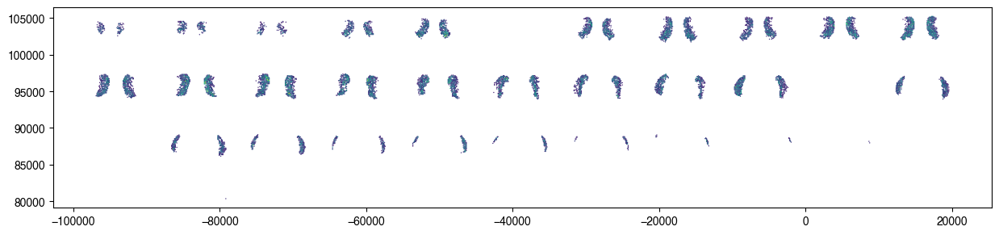

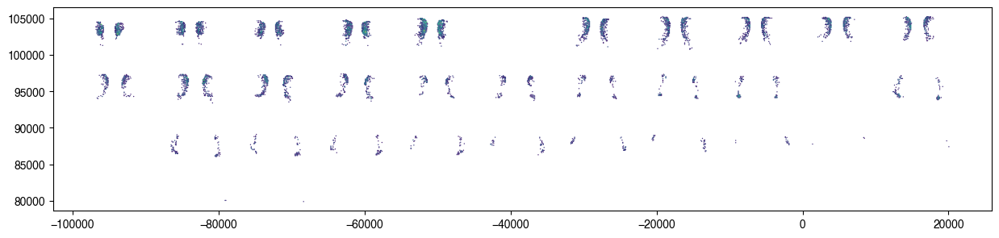

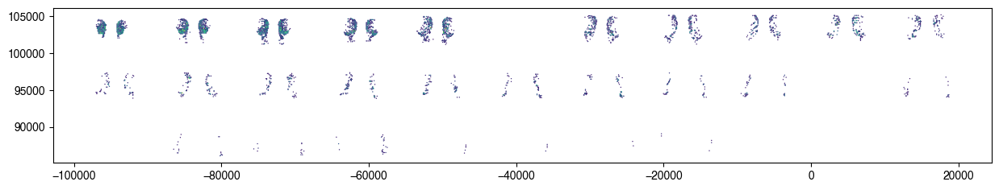

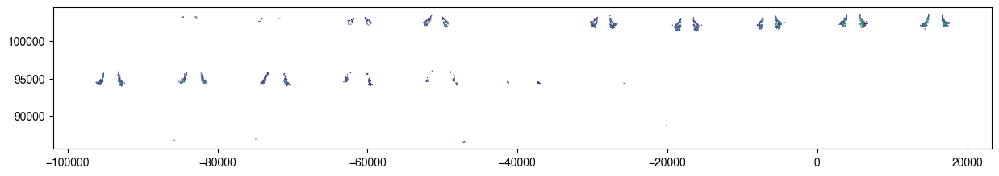

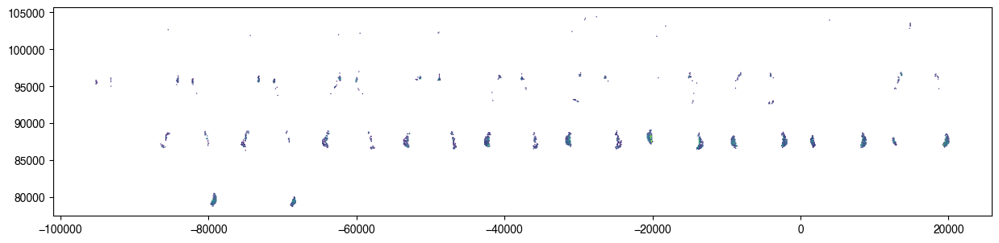

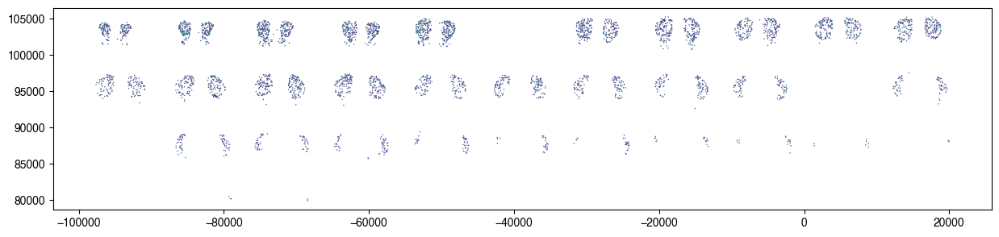

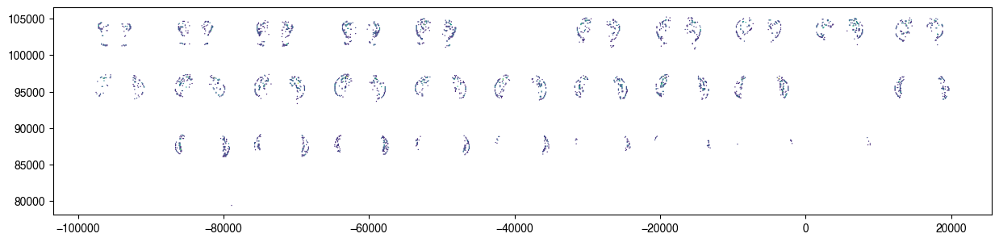

In [48]:
for i in pattern_order:
    plt.figure(figsize=(15, 15))
    mask = D_norm[:, i] > 0.1
    print(i, mask.sum())
    plt.scatter(bin_coords_609882[mask, 0], bin_coords_609882[mask, 1],
                c=D_norm[mask, i], s=1, edgecolors='none', vmin=0, vmax=1)
    plt.gca().set_aspect("equal")

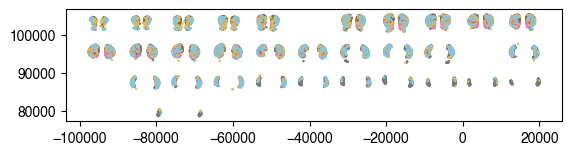

In [49]:
all_mask = np.any(D_norm > 0.1, axis=1)
largest_comp = np.argmax(D_norm[all_mask, :], axis=1)

for i, pattern_ind in enumerate(pattern_order):
    pattern_mask = largest_comp == pattern_ind
    plt.scatter(bin_coords_609882[all_mask, 0][pattern_mask],
                bin_coords_609882[all_mask, 1][pattern_mask],
                s=3, color=pal[i], edgecolors='none',
               )
plt.gca().set_aspect('equal')

In [50]:
coord_lims = [
    [(-100000, -89000), (99750, 108000)],
    [(-33500, -22500), (99750, 108000)],
    [(-88500, -77500), (91500, 99750)],
    [(-22500, -11500), (91500, 99750)],
    [(-77500, -66500), (83250, 91500)],
    [(-11500, -500), (83250, 91500)],
]

In [51]:
data_609882_dir = "/path/to/atlas_brain_609882_AIT21.0_mouse.cpq/"
spatial_xy_609882 = pd.read_parquet(os.path.join(data_609882_dir, "obsm/spatial_cirro.parquet")).values

In [52]:
all_mask = np.any(D_norm > 0.1, axis=1)
largest_comp = np.argmax(D_norm[all_mask, :], axis=1)

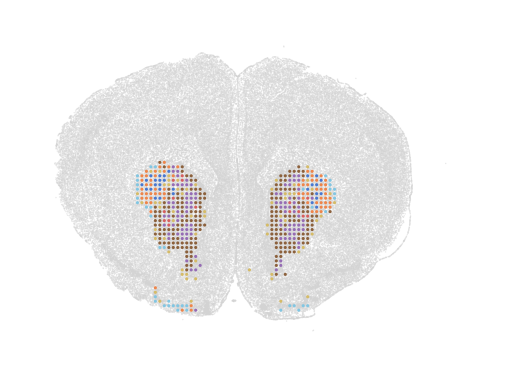

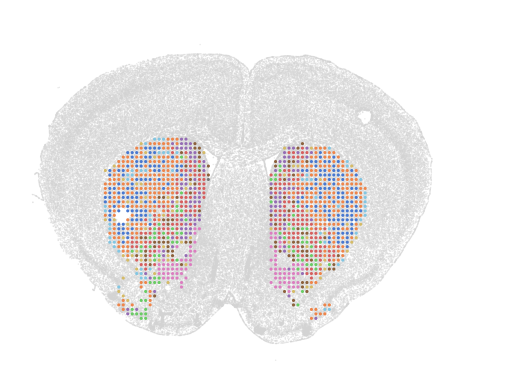

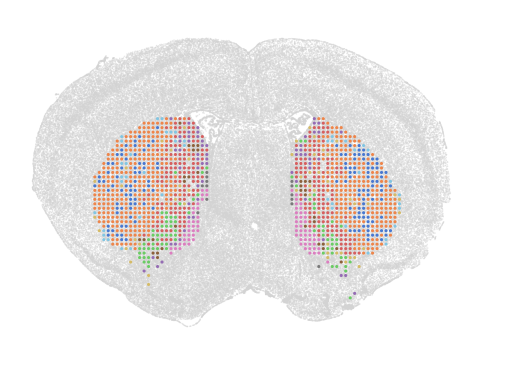

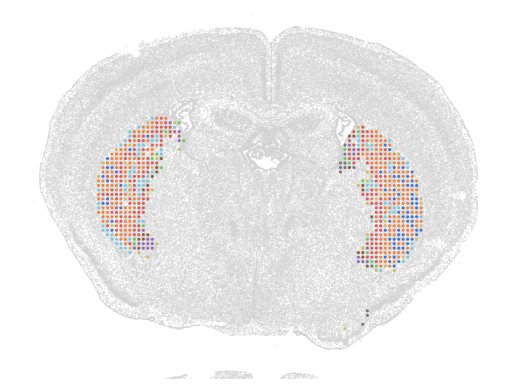

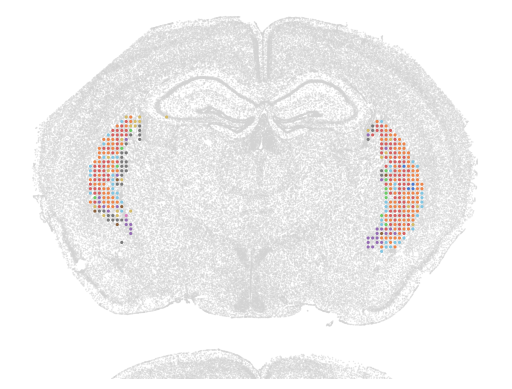

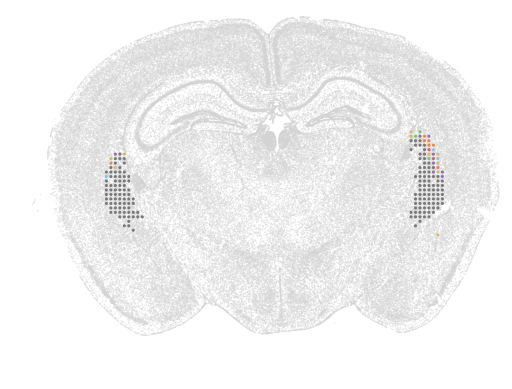

In [53]:
counter = 0
for xlim, ylim in coord_lims:
    plt.figure()
    xmask = (spatial_xy_609882[:, 0] > xlim[0]) & (spatial_xy_609882[:, 0] <= xlim[1])
    ymask = (spatial_xy_609882[:, 1] > ylim[0]) & (spatial_xy_609882[:, 1] <= ylim[1])
    plt.scatter(spatial_xy_609882[xmask & ymask, 0], spatial_xy_609882[xmask & ymask, 1],
                s=1, color='lightgray', edgecolors='none', alpha=0.5)
    for i, pattern_ind in enumerate(pattern_order):
        pattern_mask = largest_comp == pattern_ind
        plt.scatter(bin_coords_609882[all_mask, 0][pattern_mask],
                    bin_coords_609882[all_mask, 1][pattern_mask],
                    s=5, color=pal[i], edgecolors='none',
                   )
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.gca().set_aspect('equal')
    plt.xticks([])
    plt.yticks([])
    sns.despine(left=True, bottom=True)
    # plt.savefig(f"patterns_composite_slice_{counter + 1}_609882.png", dpi=300, bbox_inches='tight')
    counter += 1

In [56]:
projected_pattern_lookup = [
    "CP posterior",
    "CP medial",
    "CP central medial",
    "CP patchy",
    "CP anterior lateral",
    "CP lateral",
    "CP patchy lateral",
    "CP anterior medial",
    "CP ventral medial",
    "CP dorsal medial",
]

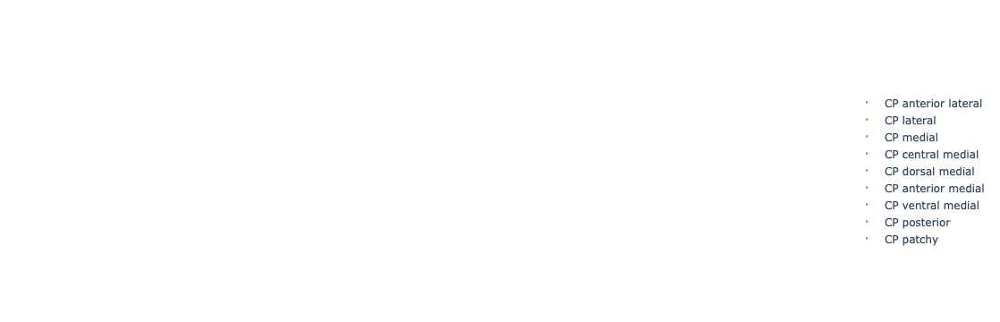

In [58]:
data_list = []
for i, pi in enumerate(pattern_order):
    mask = D_approx_638850[:, pi] > 0.1
    data_list.append(go.Scatter3d(
        x=bin_ccf_coords_638850[mask, 2],
        y=bin_ccf_coords_638850[mask, 0],
        z=bin_ccf_coords_638850[mask, 1],
        mode='markers',
        name=projected_pattern_lookup[pi],
        marker=dict(
            size=3,
            opacity=0.4,
            color=[pal[i]] * mask.sum(),

        )
    ))
layout = go.Layout(scene=dict(aspectmode="data"))
    
fig = go.Figure(data=data_list, layout=layout)
fig.show()
fig.write_html("cp_patterns.html")

In [59]:
all_masks = np.any(D_approx_638850[:, :] > 0.1, axis=1)

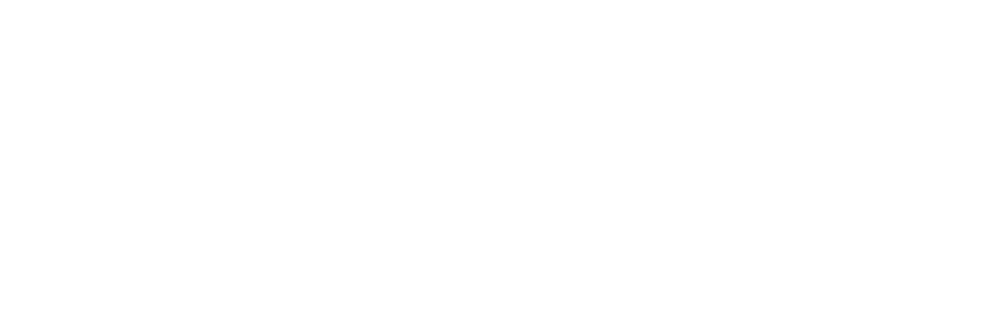

In [60]:
data_list = []
pattern_for_3d_plot = pattern_order[5]

mask = D_approx_638850[:, pattern_for_3d_plot] > 0.1
data_list.append(go.Scatter3d(
    x=bin_ccf_coords_638850[mask, 2],
    y=bin_ccf_coords_638850[mask, 0],
    z=bin_ccf_coords_638850[mask, 1],
    mode='markers',
    name=projected_pattern_lookup[i],
    marker=dict(
        size=3,
        opacity=0.9,
        color=[pal[pattern_for_3d_plot]] * mask.sum(),

    )
))

data_list.append(go.Scatter3d(
    x=bin_ccf_coords_638850[all_masks & ~mask, 2],
    y=bin_ccf_coords_638850[all_masks & ~mask, 0],
    z=bin_ccf_coords_638850[all_masks & ~mask, 1],
    mode='markers',
    name=projected_pattern_lookup[i],
    marker=dict(
        size=2,
        opacity=0.2,
        color=['#999999'] * (all_masks  & ~mask).sum(),

    )
))

z_bar = [-6, -5]
y_bar = [4, 5]
x_bar = [9, 10]

data_list.append(go.Scatter3d(
    x=x_bar,
    y=[y_bar[0], y_bar[0]],
    z=[z_bar[0], z_bar[0]],
    mode='lines',
    line=dict(
        color='black',
        width=5
    )
))
data_list.append(go.Scatter3d(
    x=[x_bar[1], x_bar[1]],
    y=y_bar,
    z=[z_bar[0], z_bar[0]],
    mode='lines',
    line=dict(
        color='black',
        width=5
    )
))
data_list.append(go.Scatter3d(
    x=[x_bar[1], x_bar[1]],
    y=[y_bar[0], y_bar[0]],
    z=z_bar,
    mode='lines',
    line=dict(
        color='black',
        width=5
    )
))

camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=1.25, y=-1.25, z=1.0)
)

layout = go.Layout(scene=dict(aspectmode="data",
                              xaxis=dict(visible=False),
                              yaxis=dict(visible=False),
                              zaxis=dict(visible=False),
                             ),
                   scene_camera=camera,
                   showlegend=False,
                  )
    
fig = go.Figure(data=data_list, layout=layout)
fig.show()
fig.write_html("cp_single_pattern.html")

In [61]:
for counter, pattern_for_3d_plot in enumerate(pattern_order):
    print(pattern_for_3d_plot)
    data_list = []
    mask = D_approx_638850[:, pattern_for_3d_plot] > 0.1
    data_list.append(go.Scatter3d(
        x=bin_ccf_coords_638850[mask, 2],
        y=bin_ccf_coords_638850[mask, 0],
        z=bin_ccf_coords_638850[mask, 1],
        mode='markers',
        marker=dict(
            size=3,
            opacity=0.9,
            color=[pal[counter]] * mask.sum(),

        )
    ))

    data_list.append(go.Scatter3d(
        x=bin_ccf_coords_638850[all_masks & ~mask, 2],
        y=bin_ccf_coords_638850[all_masks & ~mask, 0],
        z=bin_ccf_coords_638850[all_masks & ~mask, 1],
        mode='markers',
        name=projected_pattern_lookup[i],
        marker=dict(
            size=2,
            opacity=0.2,
            color=['#999999'] * (all_masks  & ~mask).sum(),

        )
    ))

    z_bar = [-6, -5]
    y_bar = [4, 5]
    x_bar = [9, 10]

    data_list.append(go.Scatter3d(
        x=x_bar,
        y=[y_bar[0], y_bar[0]],
        z=[z_bar[0], z_bar[0]],
        mode='lines',
        line=dict(
            color='black',
            width=5
        )
    ))
    data_list.append(go.Scatter3d(
        x=[x_bar[1], x_bar[1]],
        y=y_bar,
        z=[z_bar[0], z_bar[0]],
        mode='lines',
        line=dict(
            color='black',
            width=5
        )
    ))
    data_list.append(go.Scatter3d(
        x=[x_bar[1], x_bar[1]],
        y=[y_bar[0], y_bar[0]],
        z=z_bar,
        mode='lines',
        line=dict(
            color='black',
            width=5
        )
    ))

    camera = dict(
        up=dict(x=0, y=0, z=1),
        center=dict(x=0, y=0, z=0),
        eye=dict(x=1.25, y=-1.25, z=1.0)
    )

    layout = go.Layout(scene=dict(aspectmode="data",
                                  xaxis=dict(visible=False),
                                  yaxis=dict(visible=False),
                                  zaxis=dict(visible=False),
                                 ),
                       scene_camera=camera,
                       showlegend=False,
                      )

    fig = go.Figure(data=data_list, layout=layout)
    fig.write_image(f"pattern_{counter + 1}_3d.pdf")


4
5
1
2
9
7
8
0
3
6


In [63]:
ccf_cp_subdiv, _ = nrrd.read("CP_boundaries_CCFregistered.nrrd")

In [64]:
ccf_cp_subdiv[:, :, (1140 // 2):] = ccf_cp_subdiv[:, :, (1140 // 2):0:-1]

In [65]:
import matplotlib.colors as colors

In [66]:
# desaturating primary colors to ~60%
cp_subdiv_cmap = colors.ListedColormap(['white', '#33CCCC', "#33CC33", "#CCCC33", "#CC3333", "#CC33CC"])
bounds = [0, 6, 7, 8, 9, 10, 11]
norm = colors.BoundaryNorm(bounds, cp_subdiv_cmap.N)

In [76]:
cp_umap_df = pd.read_csv("group_umap_ait21/cp.umap.2d.csv", index_col=0)

In [77]:
cp_umap_meta_df = pd.read_csv("group_umap_ait21/cp_metadata_for_umap.csv", index_col=0).set_index("sample_id")

In [78]:
color_df = pd.read_csv("/path/to/WB_colorpal - clusters 230815.tsv", sep="\t")

In [79]:
color_df

,cl,cluster_id,cluster_label,cluster_color,cluster_pal
0,128,1,0001 CLA-EPd-CTX Car3 Glut_1,#00664E,#6be01d
1,129,2,0002 CLA-EPd-CTX Car3 Glut_1,#5C79CC,#f46d6b
2,130,3,0003 CLA-EPd-CTX Car3 Glut_1,#86FF4D,#7340b2
3,143,4,0004 CLA-EPd-CTX Car3 Glut_1,#CC563D,#a010cc
4,131,5,0005 CLA-EPd-CTX Car3 Glut_2,#E7FF26,#db04c2
...,...,...,...,...,...
5317,5279,5318,5318 DC NN_1,#3D5766,#417ed3
5318,5275,5319,5319 B cells NN_1,#A673FF,#d3140a
5319,5272,5320,5320 ILC NN_2,#3D6659,#09bbf7
5320,5274,5321,5321 NK cells NN_3,#5CCCA1,#5CCCA1


In [80]:
ttype_pal = sns.color_palette("tab20", n_colors=cp_umap_meta_df['cluster_id_label'].unique().size)

In [82]:
umap_ttype_color_dict = dict(zip(color_df['cluster_label'], color_df["cluster_color"]))

In [83]:
umap_ttype_color_dict['0955 STR D1 Gaba_5']

'#662E55'

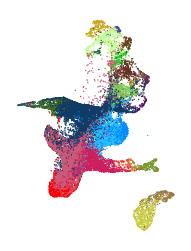

In [84]:
plt.figure(figsize=(3, 3))
plt.scatter(cp_umap_df['0'], cp_umap_df['1'], s=1,
            c=[umap_ttype_color_dict[t] for t in cp_umap_meta_df.loc[cp_umap_df.index, "cluster_id_label"]],
               edgecolors='none')
plt.gca().set_aspect('equal')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
# plt.savefig("cp_umap_ttypes.pdf", dpi=300, bbox_inches='tight')

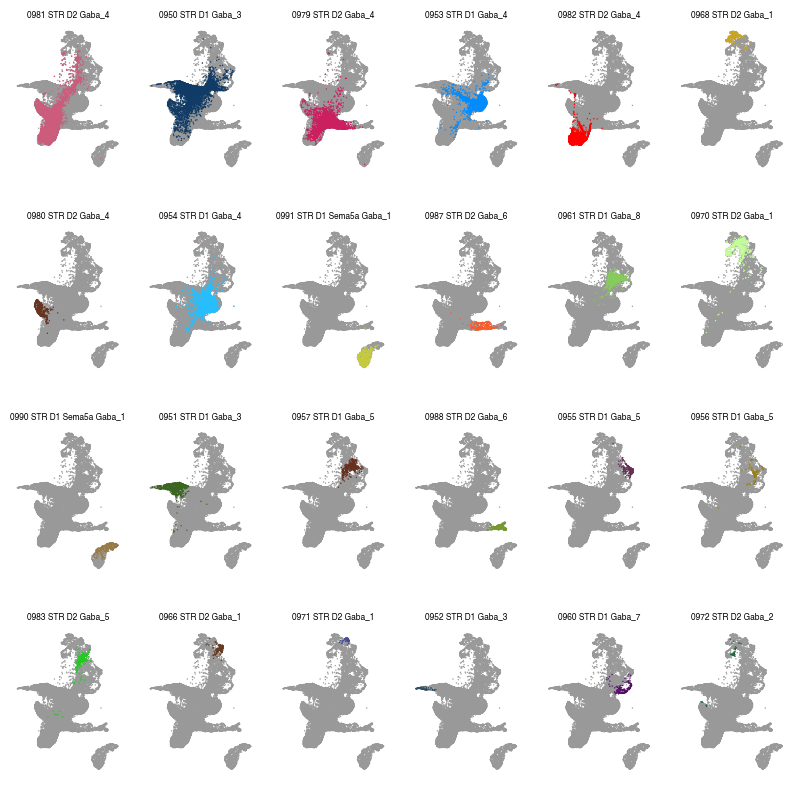

In [85]:
# Reference plots
fig, axes = plt.subplots(4, 6, figsize=(10, 10))
my_labels = cp_umap_meta_df['cluster_id_label'].unique()
for i, ax in enumerate(axes.flatten()):
    mask = cp_umap_meta_df.loc[cp_umap_df.index, "cluster_id_label"].values == my_labels[i]
    ax.scatter(cp_umap_df['0'], cp_umap_df['1'], s=1,
                c='#999999',
                   edgecolors='none')
    ax.scatter(cp_umap_df.loc[mask, '0'], cp_umap_df.loc[mask, '1'], s=1,
                c=umap_ttype_color_dict[my_labels[i]],
                   edgecolors='none')
    ax.set_title(my_labels[i], fontsize=6)
    ax.set(yticks=[], xticks=[])
    sns.despine(ax=ax, left=True, bottom=True)
    ax.set_aspect('equal')

In [86]:
subclass_color_dict = dict(zip(cp_umap_meta_df["subclass_id_label"].unique(), ttype_pal))

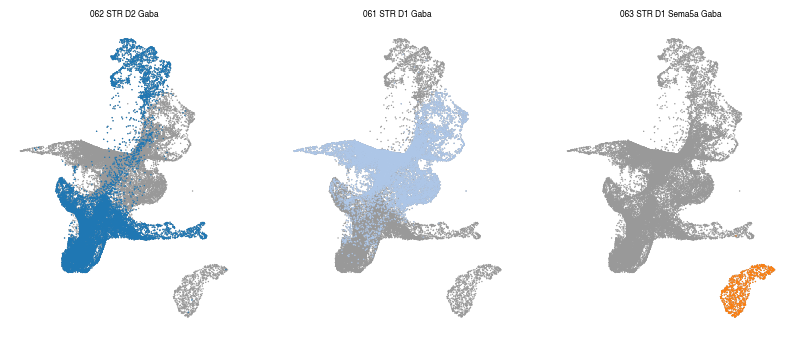

In [87]:
my_labels = cp_umap_meta_df['subclass_id_label'].unique()
fig, axes = plt.subplots(1, len(my_labels), figsize=(10, 10))
for i, ax in enumerate(axes.flatten()):
    mask = cp_umap_meta_df.loc[cp_umap_df.index, "subclass_id_label"].values == my_labels[i]
    ax.scatter(cp_umap_df['0'], cp_umap_df['1'], s=1,
                color='#999999',
                   edgecolors='none')
    ax.scatter(cp_umap_df.loc[mask, '0'], cp_umap_df.loc[mask, '1'], s=1,
                color=subclass_color_dict[my_labels[i]],
                   edgecolors='none')
    ax.set_title(my_labels[i], fontsize=6)
    ax.set(yticks=[], xticks=[])
    ax.set_aspect('equal')
    sns.despine(ax=ax, left=True, bottom=True)


In [89]:
ttype_pattern_lookup = dict(zip([s.decode() for s in ttypes],
                                [pattern_lookup[v] for v in alpha_609882.toarray().argmax(axis=0)]))

In [90]:
subclass_colors = [subclass_color_dict[s] for s in cp_umap_meta_df.loc[cp_umap_df.index, "subclass_id_label"]]

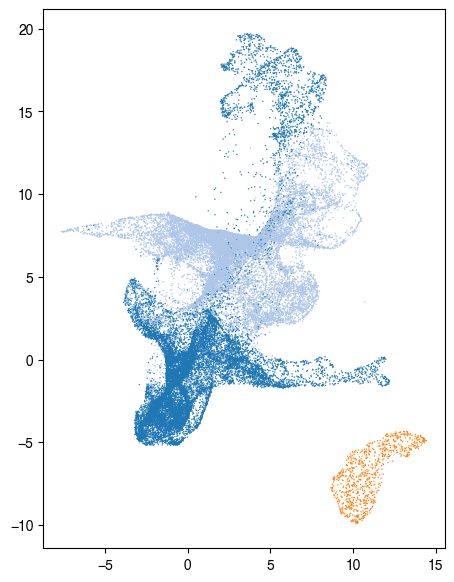

In [91]:
plt.figure(figsize=(7, 7))
plt.scatter(cp_umap_df['0'], cp_umap_df['1'], s=1,
            c=subclass_colors, edgecolors='none')
plt.gca().set_aspect('equal')

In [92]:
pattern_umap_colors = [pal[ttype_pattern_lookup[t]]
                       for t in cp_umap_meta_df.loc[cp_umap_df.index, "cluster_id_label"]]

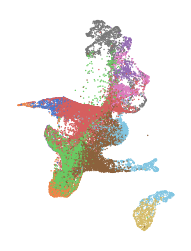

In [93]:
plt.figure(figsize=(3, 3))
plt.scatter(cp_umap_df['0'], cp_umap_df['1'], s=1,
            c=pattern_umap_colors, edgecolors='none', zorder=10)
plt.gca().set_aspect('equal')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
# plt.savefig("cp_umap_pattern.pdf", dpi=300, bbox_inches='tight')

In [94]:
ttype_pattern_lookup_ser = pd.Series(ttype_pattern_lookup)

In [95]:
# ttype_pattern_lookup_ser.to_csv("cp_ttype_nmf_patterns.csv")

In [96]:
cp_markers_df = pd.read_csv("cp_pattern_markers.csv", index_col=0)

In [97]:
# drop doubled gene
cp_markers_df.drop(columns=["Il1rapl2.1", "Car10.1"], inplace=True)

In [98]:
cp_markers_delog_df = cp_markers_df.apply(np.expm1)

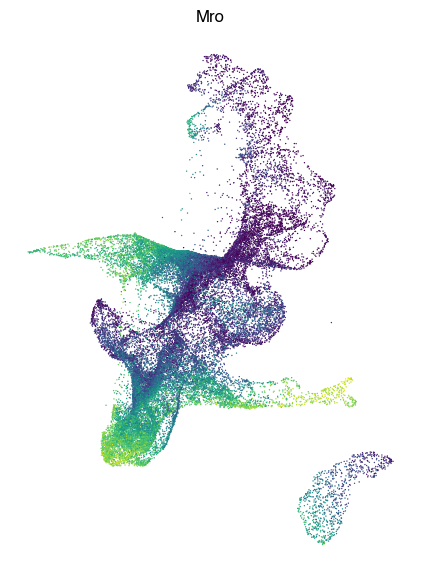

In [99]:
gene = "Mro"
pattern_to_check = 7
plt.figure(figsize=(7, 7))
plt.scatter(cp_umap_df['0'], cp_umap_df['1'], s=1,
            c=cp_markers_df.loc[cp_umap_df.index, gene], edgecolors='none', vmin=0)

plt.gca().set_aspect('equal')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.title(gene)
plt.savefig(f"cp_umap_gene_{gene}.png", bbox_inches='tight', dpi=300)

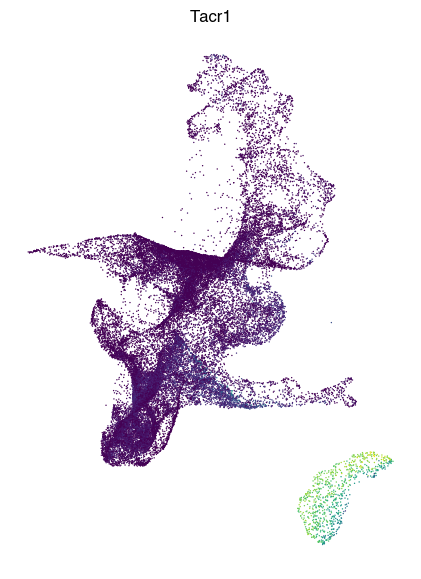

In [100]:
gene = "Tacr1"
pattern_to_check = 7
plt.figure(figsize=(7, 7))
plt.scatter(cp_umap_df['0'], cp_umap_df['1'], s=1,
            c=cp_markers_df.loc[cp_umap_df.index, gene], edgecolors='none',
            vmin=0)

plt.gca().set_aspect('equal')
plt.xticks([])
plt.yticks([])
sns.despine(left=True, bottom=True)
plt.title(gene)
plt.savefig(f"cp_umap_gene_{gene}.png", bbox_inches='tight', dpi=300)

In [101]:
frac_dict = {}
avg_dict = {}
for group_ind in range(int(k_str)):
    ttypes_in_group = ttype_pattern_lookup_ser.index[ttype_pattern_lookup_ser == group_ind].values
    samples_in_group = cp_umap_meta_df.index[cp_umap_meta_df['cluster_id_label'].isin(ttypes_in_group)].values
    sub_gene_df = cp_markers_delog_df.loc[samples_in_group, :]
    frac_dict[group_ind] = (sub_gene_df > 0).mean(axis=0)
    avg_dict[group_ind] = sub_gene_df.mean(axis=0)

frac_df = pd.DataFrame(frac_dict)
avg_df = pd.DataFrame(avg_dict)

In [102]:
avg_norm_df = avg_df.div(avg_df.max(axis=1), axis=0)

In [103]:
pattern_order

[4, 5, 1, 2, 9, 7, 8, 0, 3, 6]

In [104]:
pattern_names = [
    "anterior lateral",
    "lateral",
    "medial",
    "central medial",
    "dorsal medial",
    "anterior medial",
    "ventral medial",
    "posterior",
    "patchy",
    "patchy lateral",
]

In [105]:
import matplotlib.gridspec as gridspec

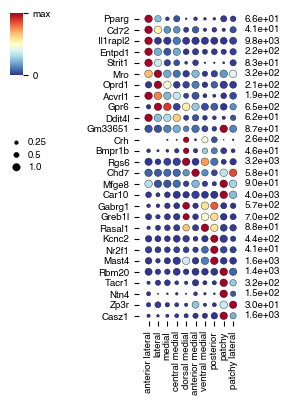

In [107]:
fig = plt.figure(figsize=(3, 4))
gs = gridspec.GridSpec(3, 2, width_ratios=(1, 8), wspace=2, hspace=1)
scatter_factor = 30

ax = plt.subplot(gs[:, 1])
cbar_ax = plt.subplot(gs[0, 0])
for i, g in enumerate(avg_norm_df.index.unique()):
    s = ax.scatter(
        x=np.arange(len(pattern_order)),
        y=[i] * len(pattern_order),
        c=avg_norm_df.loc[g, :],
        s=frac_df.loc[g, :] * scatter_factor,
        vmin=0,
        vmax=1,
        edgecolors='black',
        linewidths=0.25,
        cmap='RdYlBu_r',
    )
    if i == 0:
        cb = plt.colorbar(s, cax=cbar_ax)
    ax.text(len(pattern_order) + 0.2,
            i,
            f"{avg_df.loc[g, :].max():.1e}",
            va='center',
            ha='left',
            fontsize=7,
           )
cb.set_ticks([0, 1])
cb.set_ticklabels(["0", "max"])
cb.outline.set_visible(False)
cbar_ax.tick_params(labelsize=7)

dot_ax = plt.subplot(gs[1, 0])

dot_ax.scatter(
    x=[0] * 3,
    y=[0, 1, 2],
    s=np.array([1.0, 0.5, 0.25]) * scatter_factor,
    color='black',
    edgecolors='black',
    linewidths=0.25,
)
dot_ax.set_ylim(-2.5, 2.5)
dot_ax.set(xticks=[], yticks=[])
for y, t in zip((0, 1, 2), ("1.0", "0.5", "0.25")):
    dot_ax.text(0.1, y, t, fontsize=7, va='center', ha='left')
sns.despine(ax=dot_ax, left=True, bottom=True)

ax.set_yticks(range(avg_norm_df.shape[0]))
ax.set_yticklabels(avg_norm_df.index, fontsize=7)
ax.set_xticks(np.arange(len(pattern_order)))
ax.set_xticklabels(pattern_names, rotation=90, fontsize=7)
ax.set_ylim(-0.5, avg_norm_df.shape[0] - 0.5)
ax.set_xlim(-1, len(pattern_order))
ax.invert_yaxis()

sns.despine(ax=ax, left=True, bottom=True)

# plt.savefig("cp_markergenes.pdf", bbox_inches='tight', dpi=300)

In [108]:
import matplotlib.path as mpl_path

In [109]:
from shapely.geometry import Polygon, Point

0 400
1 450
2 500
3 550
4 600
5 700


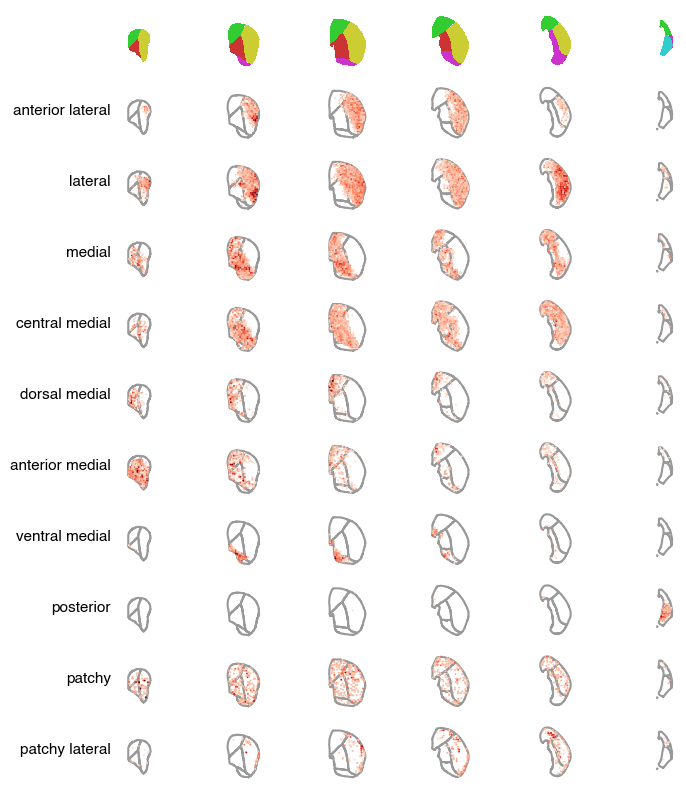

In [112]:
slice_x_list = [400, 450, 500, 550, 600, 700]
fig, axes = plt.subplots(len(pattern_order) + 1, len(slice_x_list), figsize=(7.5, 10))

extra_slice = 0.25 #0.15

for i, slice_x in enumerate(slice_x_list):
    print(i, slice_x)
    ccf_div_slice = ccf_cp_subdiv[slice_x, :, :]
    # get borders within slice
    slice_cp_div_borders = {}
    for div_ind in [6, 7, 8, 9, 10]:
        slice_binary = ccf_div_slice == div_ind
        contours = find_contours(slice_binary, level=0.5)
        if len(contours) == 0:
            continue
        elif len(contours) == 2:
            slice_cp_div_borders[div_ind] = contours
        else:
            # find two biggest contours
            bbox_areas = []
            for c in contours:
                w = c[:, 0].max() - c[:, 0].min()
                h = c[:, 1].max() - c[:, 1].min()
                bbox_areas.append(w * h)
            contour_order = np.argsort(bbox_areas)
            slice_cp_div_borders[div_ind] = [contours[contour_order[-1]], contours[contour_order[-2]]]
    for j, pattern_ind in enumerate(pattern_order):
        ax = axes[j + 1, i]
        for b in slice_cp_div_borders.values():
            for c in b:
                ax.plot(c[:, 1], c[:, 0], c='#999999', zorder=100)
        
        pattern_mask = D_approx_638850[:, pattern_ind] > 0.1
        slice_mask = ((bin_ccf_coords_638850[:, 0] > (slice_x / 100) - extra_slice) &
                      (bin_ccf_coords_638850[:, 0] <= (slice_x / 100) + extra_slice))
        mask = pattern_mask & slice_mask
        
        # check if within contours
        points = np.vstack([bin_ccf_coords_638850[mask, 2] * 100, -bin_ccf_coords_638850[mask, 1] * 100]).T
        if points.shape[0] > 0:
            point_list = [Point(points[p, 0], points[p, 1]) for p in range(points.shape[0])]
            contour_mask = np.zeros(points.shape[0], dtype=bool)
            for b in slice_cp_div_borders.values():
                for c in b:
                    this_contour = Polygon(c[:, [1, 0]])
                    this_contour_mask = np.array([this_contour.contains(p) for p in point_list])
                    contour_mask = contour_mask | this_contour_mask

            ax.scatter(points[contour_mask, 0], points[contour_mask, 1],
                        c=D_approx_638850[mask, pattern_ind][contour_mask],
                        s=2, edgecolors='none', vmin=0, vmax=0.8, zorder=100, alpha=1, cmap='Reds')
    #         ax.scatter(points[contour_mask, 0], points[contour_mask, 1],
    #                     c='k', s=10, edgecolors='none')
        ax.set_aspect('equal')        
        ax.set_ylim(600, 200)
#         ax.set_xlim(150, 1140 // 2)
        ax.set_xlim(1140 //2, 1140 - 150)
        ax.set_xticks([])
        ax.set_yticks([])
        sns.despine(ax=ax, left=True, bottom=True)
        if i == 0:
            ax.set_ylabel(pattern_names[j], fontsize=11, ha='right', va='center', rotation=0)
        
    ax = axes[0, i]
    ax.imshow(ccf_cp_subdiv[slice_x, :, :], cmap=cp_subdiv_cmap, norm=norm, interpolation='none')
    ax.set_aspect('equal')        
    ax.set_ylim(600, 200)
#     ax.set_xlim(150, 1140 // 2)
    ax.set_xlim(1140 //2, 1140 - 150)
    ax.set_xticks([])
    ax.set_yticks([])
    sns.despine(ax=ax, left=True, bottom=True)
# plt.savefig("cp_patterns_vs_subdiv.pdf", bbox_inches='tight', dpi=300)

In [113]:
sorter = sorted(np.arange(len(ttypes)),
                key=lambda x: (pattern_lookup[alpha_609882.toarray().argmax(axis=0)[x]],
                               -alpha_609882.toarray().max(axis=0)[x]))

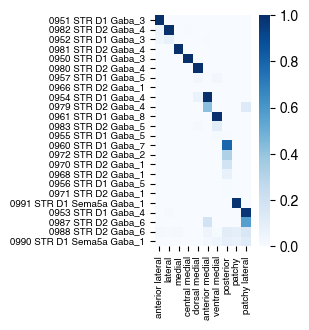

In [114]:
# Plot a sorted heatmap of the weights

fig = plt.figure(figsize=(2, 3))

plot_data = alpha_609882.toarray()[:, sorter][pattern_order, :].T
# plot_data[plot_data == 0] = np.nan

sns.heatmap(
    data=plot_data,
    yticklabels=[s.decode() for s in ttypes[sorter]],
    xticklabels=pattern_names,
    cmap='Blues',
    vmin=0, vmax=1,
    square=True,
)
ax = plt.gca()
ax.tick_params(labelsize=7)
# plt.savefig("cp_pattern_weights.pdf", bbox_inches='tight', dpi=300)